# Music Generation with Visualization and Audio Playback

This notebook demonstrates the music generation system with visualizations and audio playback capabilities.

In [109]:
# Import necessary modules
from music_generator import  MusicGenerator, play_generated_audio 

# Initialize MusicGenerator
generator = MusicGenerator(sequence_length=100)

# Step 1: Process MIDI Files
midi_path = "midi_files/archives"

try:
    generator.process_midi_files(midi_path)
    print(f"Processed MIDI files from {midi_path}.")
except Exception as e:
    print(f"Error processing MIDI files: {e}")

Extracted 20 notes from midi_files/archives/Cymatics - Lofi MIDI 2 - C Maj.mid
Extracted 20 notes from midi_files/archives/Cymatics - Eternity MIDI 19 - A Min.mid
Extracted 16 notes from midi_files/archives/Cymatics - Lofi MIDI 3 - C Min.mid
Extracted 26 notes from midi_files/archives/Cymatics - Eternity MIDI 18 - A Maj.mid
Extracted 15 notes from midi_files/archives/Piano MIDI (2).mid
Extracted 8 notes from midi_files/archives/Rhodes MIDI (7).mid
Extracted 45 notes from midi_files/archives/Cymatics - Eternity MIDI 11 - A Maj.mid
Extracted 56 notes from midi_files/archives/Cymatics - Eternity MIDI 7 - E Min.mid
Extracted 11 notes from midi_files/archives/Rhodes MIDI (6).mid
Extracted 64 notes from midi_files/archives/Cymatics - Lofi MIDI 13 - E Min.mid
Extracted 40 notes from midi_files/archives/Cymatics - Lofi MIDI 18 - G Maj.mid
Extracted 22 notes from midi_files/archives/9.mid
Extracted 52 notes from midi_files/archives/Piano MIDI (3).mid
Extracted 20 notes from midi_files/archives/

In [127]:
# Step 2: Create and Train the Model
try:
    generator.create_model()
    print("Model created successfully.")
    # Train the model
    generator.training_history = generator.train(epochs=20, batch_size=64)
    print("Model trained successfully.")
except Exception as e:
    print(f"Error during model creation or training: {e}")

Model created successfully
Model created successfully.
Epoch 1/20
23/23 ━━━━━━━━━━━━━━━━━━━━ 122s 5s/step - loss: 5.3178 - val_loss: 5.2626
Epoch 2/20
23/23 ━━━━━━━━━━━━━━━━━━━━ 128s 6s/step - loss: 4.9332 - val_loss: 5.2783
Epoch 3/20
23/23 ━━━━━━━━━━━━━━━━━━━━ 156s 7s/step - loss: 4.8814 - val_loss: 5.3595
Epoch 4/20
23/23 ━━━━━━━━━━━━━━━━━━━━ 162s 5s/step - loss: 4.8946 - val_loss: 5.4024
Epoch 5/20
23/23 ━━━━━━━━━━━━━━━━━━━━ 105s 4s/step - loss: 4.8822 - val_loss: 5.4723
Epoch 6/20
23/23 ━━━━━━━━━━━━━━━━━━━━ 100s 4s/step - loss: 4.8935 - val_loss: 5.3396
Epoch 7/20
23/23 ━━━━━━━━━━━━━━━━━━━━ 108s 5s/step - loss: 4.8742 - val_loss: 5.3486
Epoch 8/20
23/23 ━━━━━━━━━━━━━━━━━━━━ 86s 4s/step - loss: 4.8690 - val_loss: 5.4436
Epoch 9/20
23/23 ━━━━━━━━━━━━━━━━━━━━ 86s 4s/step - loss: 4.8458 - val_loss: 5.3521
Epoch 10/20
23/23 ━━━━━━━━━━━━━━━━━━━━ 87s 4s/step - loss: 4.8638 - val_loss: 5.5016
Epoch 11/20
23/23 ━━━━━━━━━━━━━━━━━━━━ 88s 4s/step - loss: 4.8291 - val_loss: 5.4055
Epoch 12/20


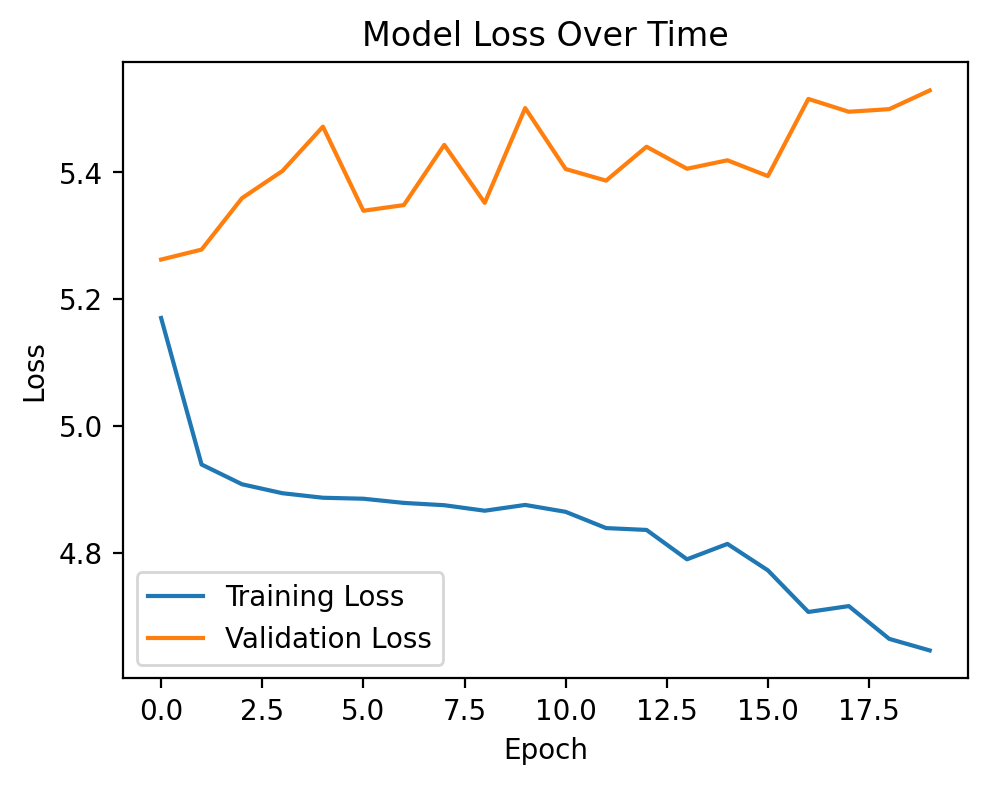

In [128]:
# Plot training history
try:
    generator.plot_training_history()
except ValueError as e:
    print(f"Error plotting training history: {e}")

In [129]:
# Step 4: Generate Music
start_sequence = ["A4", "B4", "C5", "D5", "E5"] * 20  # Replace with a valid starting sequence
generated_notes = generator.generate_notes(start_sequence, num_notes=200, temperature=1.0)

Generated 200 notes


In [131]:
generator.create_midi(generated_notes, "audio/new_song3.mid")# enter new saved file name
print("\nSaving the model...")
generator.save_model()
print("\nProcess completed successfully!")

2025-01-01 02:40:22,160 - absl - WARNING - You are saving your model as an HDF5 file via `model.save()` or `keras.saving.save_model(model)`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')` or `keras.saving.save_model(model, 'my_model.keras')`. 


MIDI file created successfully: new_song3.mid

Saving the model...
Model saved to music_model.h5
Note mappings saved to note_mappings.pkl

Process completed successfully!


In [132]:
# Step 7: Play Generated Audio
play_generated_audio(generator, generated_notes)

Playing generated audio...
